In [ ]:
import numpy as np
import pandas as pd
import h3
from haversine import haversine
import swifter

import networkx as nx
from tqdm import tqdm
import time
import folium
from folium import plugins

import math


In [2]:
filtered_df=pd.read_csv('trip.csv')

filtered_df

,latitude,longitude,user_id,log_time
0,25.122320,55.229050,8,2021-04-17 08:29:42
1,25.122290,55.228939,8,2021-04-17 08:30:02
2,25.122267,55.228962,8,2021-04-17 08:30:17
3,25.122168,55.229042,8,2021-04-17 08:30:34
4,25.122175,55.229023,8,2021-04-17 08:35:14
...,...,...,...,...
1481,25.121456,55.228443,8,2021-04-17 18:53:58
1482,25.121458,55.228447,8,2021-04-17 18:54:28
1483,25.119301,55.234035,8,2021-04-17 23:56:36
1484,25.121456,55.228447,8,2021-04-17 23:56:44


In [3]:
initial_location = (filtered_df.iloc[0]['latitude'], filtered_df.iloc[0]['longitude'])
m = folium.Map(location=initial_location, zoom_start=12)
m

In [4]:

for index, row in filtered_df.iterrows():
    folium.Marker(location=(row['latitude'], row['longitude']), popup=row['log_time']).add_to(m)

locations = list(zip(filtered_df['latitude'], filtered_df['longitude']))
folium.PolyLine(locations=locations, color='blue').add_to(m)
m


In [5]:
print(filtered_df.dtypes)

latitude     float64
longitude    float64
user_id        int64
log_time      object
dtype: object


In [6]:
filtered_df['log_time'] = pd.to_datetime(filtered_df['log_time'])


In [7]:
print(filtered_df.dtypes)

latitude            float64
longitude           float64
user_id               int64
log_time     datetime64[ns]
dtype: object


In [8]:
filtered_df= filtered_df.sort_values(by=["user_id", "log_time"])

# Identifying Stop zones

When talking about a stop zone it is not only the positions where the driver has stopped for a while, we also 
talk about the places where the driver stayed in the same zone for a while maybe beacuse of traffic. to do so we must calculate the difference in time between each 2 consecutive recods and see if for a duration of 180 s he actually made a total distance less than a threshold.

step1: calculate the difference between recods

In [9]:
filtered_df['prev_log_time'] = filtered_df.groupby('user_id')['log_time'].shift()
filtered_df['prev_log_time'].fillna(pd.Timestamp(0), inplace=True) 
filtered_df['time_difference'] = filtered_df['log_time'] - filtered_df['prev_log_time']

In [10]:
filtered_df

,latitude,longitude,user_id,log_time,prev_log_time,time_difference
0,25.122320,55.229050,8,2021-04-17 08:29:42,1970-01-01 00:00:00,18734 days 08:29:42
1,25.122290,55.228939,8,2021-04-17 08:30:02,2021-04-17 08:29:42,0 days 00:00:20
2,25.122267,55.228962,8,2021-04-17 08:30:17,2021-04-17 08:30:02,0 days 00:00:15
3,25.122168,55.229042,8,2021-04-17 08:30:34,2021-04-17 08:30:17,0 days 00:00:17
4,25.122175,55.229023,8,2021-04-17 08:35:14,2021-04-17 08:30:34,0 days 00:04:40
...,...,...,...,...,...,...
1481,25.121456,55.228443,8,2021-04-17 18:53:58,2021-04-17 18:53:28,0 days 00:00:30
1482,25.121458,55.228447,8,2021-04-17 18:54:28,2021-04-17 18:53:58,0 days 00:00:30
1483,25.119301,55.234035,8,2021-04-17 23:56:36,2021-04-17 18:54:28,0 days 05:02:08
1484,25.121456,55.228447,8,2021-04-17 23:56:44,2021-04-17 23:56:36,0 days 00:00:08


In [11]:
filtered_df = filtered_df.iloc[1:]
filtered_df

,latitude,longitude,user_id,log_time,prev_log_time,time_difference
1,25.122290,55.228939,8,2021-04-17 08:30:02,2021-04-17 08:29:42,0 days 00:00:20
2,25.122267,55.228962,8,2021-04-17 08:30:17,2021-04-17 08:30:02,0 days 00:00:15
3,25.122168,55.229042,8,2021-04-17 08:30:34,2021-04-17 08:30:17,0 days 00:00:17
4,25.122175,55.229023,8,2021-04-17 08:35:14,2021-04-17 08:30:34,0 days 00:04:40
5,25.123371,55.236301,8,2021-04-17 08:35:14,2021-04-17 08:35:14,0 days 00:00:00
...,...,...,...,...,...,...
1481,25.121456,55.228443,8,2021-04-17 18:53:58,2021-04-17 18:53:28,0 days 00:00:30
1482,25.121458,55.228447,8,2021-04-17 18:54:28,2021-04-17 18:53:58,0 days 00:00:30
1483,25.119301,55.234035,8,2021-04-17 23:56:36,2021-04-17 18:54:28,0 days 05:02:08
1484,25.121456,55.228447,8,2021-04-17 23:56:44,2021-04-17 23:56:36,0 days 00:00:08


step 2: calculate the difference between gps positions

In [12]:
filtered_df['prev_latitude'] = filtered_df.groupby('user_id')['latitude'].shift()

filtered_df['prev_longitude'] = filtered_df.groupby('user_id')['longitude'].shift()


/tmp/ipykernel_16788/1132585238.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_df['prev_latitude'] = filtered_df.groupby('user_id')['latitude'].shift()
/tmp/ipykernel_16788/1132585238.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_df['prev_longitude'] = filtered_df.groupby('user_id')['longitude'].shift()


In [13]:
filtered_df

,latitude,longitude,user_id,log_time,prev_log_time,time_difference,prev_latitude,prev_longitude
1,25.122290,55.228939,8,2021-04-17 08:30:02,2021-04-17 08:29:42,0 days 00:00:20,NaN,NaN
2,25.122267,55.228962,8,2021-04-17 08:30:17,2021-04-17 08:30:02,0 days 00:00:15,25.122290,55.228939
3,25.122168,55.229042,8,2021-04-17 08:30:34,2021-04-17 08:30:17,0 days 00:00:17,25.122267,55.228962
4,25.122175,55.229023,8,2021-04-17 08:35:14,2021-04-17 08:30:34,0 days 00:04:40,25.122168,55.229042
5,25.123371,55.236301,8,2021-04-17 08:35:14,2021-04-17 08:35:14,0 days 00:00:00,25.122175,55.229023
...,...,...,...,...,...,...,...,...
1481,25.121456,55.228443,8,2021-04-17 18:53:58,2021-04-17 18:53:28,0 days 00:00:30,25.121458,55.228451
1482,25.121458,55.228447,8,2021-04-17 18:54:28,2021-04-17 18:53:58,0 days 00:00:30,25.121456,55.228443
1483,25.119301,55.234035,8,2021-04-17 23:56:36,2021-04-17 18:54:28,0 days 05:02:08,25.121458,55.228447
1484,25.121456,55.228447,8,2021-04-17 23:56:44,2021-04-17 23:56:36,0 days 00:00:08,25.119301,55.234035


In [14]:
filtered_df.dropna(inplace=True)
filtered_df

/tmp/ipykernel_16788/1380752360.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_df.dropna(inplace=True)


,latitude,longitude,user_id,log_time,prev_log_time,time_difference,prev_latitude,prev_longitude
2,25.122267,55.228962,8,2021-04-17 08:30:17,2021-04-17 08:30:02,0 days 00:00:15,25.122290,55.228939
3,25.122168,55.229042,8,2021-04-17 08:30:34,2021-04-17 08:30:17,0 days 00:00:17,25.122267,55.228962
4,25.122175,55.229023,8,2021-04-17 08:35:14,2021-04-17 08:30:34,0 days 00:04:40,25.122168,55.229042
5,25.123371,55.236301,8,2021-04-17 08:35:14,2021-04-17 08:35:14,0 days 00:00:00,25.122175,55.229023
6,25.120134,55.229893,8,2021-04-17 08:35:15,2021-04-17 08:35:14,0 days 00:00:01,25.123371,55.236301
...,...,...,...,...,...,...,...,...
1481,25.121456,55.228443,8,2021-04-17 18:53:58,2021-04-17 18:53:28,0 days 00:00:30,25.121458,55.228451
1482,25.121458,55.228447,8,2021-04-17 18:54:28,2021-04-17 18:53:58,0 days 00:00:30,25.121456,55.228443
1483,25.119301,55.234035,8,2021-04-17 23:56:36,2021-04-17 18:54:28,0 days 05:02:08,25.121458,55.228447
1484,25.121456,55.228447,8,2021-04-17 23:56:44,2021-04-17 23:56:36,0 days 00:00:08,25.119301,55.234035


In [15]:
filtered_df['dist_km'] =filtered_df.swifter.apply(
    lambda row: haversine((row['latitude'],row['longitude']),
                          (row['prev_latitude'],row['prev_longitude'])),axis=1)

Dask Apply:   0%|          | 0/24 [00:00<?, ?it/s]

/tmp/ipykernel_16788/412691802.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_df['dist_km'] =filtered_df.swifter.apply(


step 3: give a different id for each consecutive records who when summed together represent less or equal 180 s

In [16]:
filtered_df["time_difference"] = filtered_df["time_difference"].dt.total_seconds()

threshold = 180  
step_id = 1
cumulative_time = 0
step_list = []

for time_diff in filtered_df["time_difference"]:
    if cumulative_time + time_diff <= threshold:
        cumulative_time += time_diff
    else:
        step_id += 1
        cumulative_time = time_diff  
    step_list.append(step_id)

/tmp/ipykernel_16788/3218703683.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_df["time_difference"] = filtered_df["time_difference"].dt.total_seconds()


In [17]:
filtered_df["step"] = step_list 
filtered_df

/tmp/ipykernel_16788/2856767861.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_df["step"] = step_list


,latitude,longitude,user_id,log_time,prev_log_time,time_difference,prev_latitude,prev_longitude,dist_km,step
2,25.122267,55.228962,8,2021-04-17 08:30:17,2021-04-17 08:30:02,15.0,25.122290,55.228939,0.003450,1
3,25.122168,55.229042,8,2021-04-17 08:30:34,2021-04-17 08:30:17,17.0,25.122267,55.228962,0.013640,1
4,25.122175,55.229023,8,2021-04-17 08:35:14,2021-04-17 08:30:34,280.0,25.122168,55.229042,0.002065,2
5,25.123371,55.236301,8,2021-04-17 08:35:14,2021-04-17 08:35:14,0.0,25.122175,55.229023,0.744691,3
6,25.120134,55.229893,8,2021-04-17 08:35:15,2021-04-17 08:35:14,1.0,25.123371,55.236301,0.738754,3
...,...,...,...,...,...,...,...,...,...,...
1481,25.121456,55.228443,8,2021-04-17 18:53:58,2021-04-17 18:53:28,30.0,25.121458,55.228451,0.000836,224
1482,25.121458,55.228447,8,2021-04-17 18:54:28,2021-04-17 18:53:58,30.0,25.121456,55.228443,0.000460,224
1483,25.119301,55.234035,8,2021-04-17 23:56:36,2021-04-17 18:54:28,18128.0,25.121458,55.228447,0.611582,225
1484,25.121456,55.228447,8,2021-04-17 23:56:44,2021-04-17 23:56:36,8.0,25.119301,55.234035,0.611495,226


step4: measure the total distance for each unique group

In [18]:
filtered_df['cumulative_dist'] = filtered_df.groupby('step')['dist_km'].cumsum()

dist_done_values = filtered_df.groupby('step')['cumulative_dist'].last()

timestep_to_dist_done = dist_done_values.to_dict()

filtered_df['dist_done'] = filtered_df['step'].map(timestep_to_dist_done)



/tmp/ipykernel_16788/3629359145.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_df['cumulative_dist'] = filtered_df.groupby('step')['dist_km'].cumsum()
/tmp/ipykernel_16788/3629359145.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_df['dist_done'] = filtered_df['step'].map(timestep_to_dist_done)


In [19]:
filtered_df

,latitude,longitude,user_id,log_time,prev_log_time,time_difference,prev_latitude,prev_longitude,dist_km,step,cumulative_dist,dist_done
2,25.122267,55.228962,8,2021-04-17 08:30:17,2021-04-17 08:30:02,15.0,25.122290,55.228939,0.003450,1,0.003450,0.017090
3,25.122168,55.229042,8,2021-04-17 08:30:34,2021-04-17 08:30:17,17.0,25.122267,55.228962,0.013640,1,0.017090,0.017090
4,25.122175,55.229023,8,2021-04-17 08:35:14,2021-04-17 08:30:34,280.0,25.122168,55.229042,0.002065,2,0.002065,0.002065
5,25.123371,55.236301,8,2021-04-17 08:35:14,2021-04-17 08:35:14,0.0,25.122175,55.229023,0.744691,3,0.744691,3.333417
6,25.120134,55.229893,8,2021-04-17 08:35:15,2021-04-17 08:35:14,1.0,25.123371,55.236301,0.738754,3,1.483446,3.333417
...,...,...,...,...,...,...,...,...,...,...,...,...
1481,25.121456,55.228443,8,2021-04-17 18:53:58,2021-04-17 18:53:28,30.0,25.121458,55.228451,0.000836,224,0.001238,0.001698
1482,25.121458,55.228447,8,2021-04-17 18:54:28,2021-04-17 18:53:58,30.0,25.121456,55.228443,0.000460,224,0.001698,0.001698
1483,25.119301,55.234035,8,2021-04-17 23:56:36,2021-04-17 18:54:28,18128.0,25.121458,55.228447,0.611582,225,0.611582,0.611582
1484,25.121456,55.228447,8,2021-04-17 23:56:44,2021-04-17 23:56:36,8.0,25.119301,55.234035,0.611495,226,0.611495,0.611495


step 6: if the total distace is less than a threshold it will be considered as a stop zone

In [20]:
dist_th=0.800
filtered_df['is_stop'] = (filtered_df['dist_done'] >= dist_th).astype(int)

/tmp/ipykernel_16788/2577138486.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_df['is_stop'] = (filtered_df['dist_done'] >= dist_th).astype(int)


In [21]:
filtered_df[filtered_df['is_stop']==0]

,latitude,longitude,user_id,log_time,prev_log_time,time_difference,prev_latitude,prev_longitude,dist_km,step,cumulative_dist,dist_done,is_stop
2,25.122267,55.228962,8,2021-04-17 08:30:17,2021-04-17 08:30:02,15.0,25.122290,55.228939,0.003450,1,0.003450,0.017090,0
3,25.122168,55.229042,8,2021-04-17 08:30:34,2021-04-17 08:30:17,17.0,25.122267,55.228962,0.013640,1,0.017090,0.017090,0
4,25.122175,55.229023,8,2021-04-17 08:35:14,2021-04-17 08:30:34,280.0,25.122168,55.229042,0.002065,2,0.002065,0.002065,0
18,25.121943,55.226288,8,2021-04-17 08:38:33,2021-04-17 08:37:58,35.0,25.121943,55.226288,0.000000,4,0.000000,0.359102,0
19,25.121943,55.226288,8,2021-04-17 08:39:04,2021-04-17 08:38:33,31.0,25.121943,55.226288,0.000000,4,0.000000,0.359102,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1481,25.121456,55.228443,8,2021-04-17 18:53:58,2021-04-17 18:53:28,30.0,25.121458,55.228451,0.000836,224,0.001238,0.001698,0
1482,25.121458,55.228447,8,2021-04-17 18:54:28,2021-04-17 18:53:58,30.0,25.121456,55.228443,0.000460,224,0.001698,0.001698,0
1483,25.119301,55.234035,8,2021-04-17 23:56:36,2021-04-17 18:54:28,18128.0,25.121458,55.228447,0.611582,225,0.611582,0.611582,0
1484,25.121456,55.228447,8,2021-04-17 23:56:44,2021-04-17 23:56:36,8.0,25.119301,55.234035,0.611495,226,0.611495,0.611495,0


viz of results

In [22]:
# Create a Folium map centered around the initial location
initial_location = (filtered_df.iloc[0]['latitude'], filtered_df.iloc[0]['longitude'])
m1 = folium.Map(location=initial_location, zoom_start=12)
for index, row in filtered_df.iterrows():
    folium.Marker(location=(row['latitude'], row['longitude']), popup=row['log_time']).add_to(m1)

locations = list(zip(filtered_df['latitude'], filtered_df['longitude']))
folium.PolyLine(locations=locations, color='green').add_to(m1)
m1

In [23]:
import folium
from folium import plugins

# Set the initial location for the map
initial_location = (filtered_df.iloc[0]['latitude'], filtered_df.iloc[0]['longitude'])
m = folium.Map(location=initial_location, zoom_start=12)

# Loop through the data and add markers
for index, row in filtered_df.iterrows():
    if row['is_stop'] == 0:
        color = 'red'  # Moving points
    else:
        color = 'green'  # Stopped points

    # Add marker
    folium.Marker(
        location=(row['latitude'], row['longitude']),
        popup=row['log_time'],
        icon=folium.Icon(color=color)  # Removed invalid icon_size
    ).add_to(m)

# Draw the path
locations = list(zip(filtered_df['latitude'], filtered_df['longitude']))
plugins.AntPath(locations, color='blue').add_to(m)

# Display map
m


In [24]:

filtered_stops = filtered_df[filtered_df['is_stop'] == 0]



In [25]:
import folium
from folium import plugins

initial_location = (filtered_stops.iloc[0]['latitude'], filtered_stops.iloc[0]['longitude'])
m = folium.Map(location=initial_location, zoom_start=12)

for index, row in filtered_stops.iterrows():

    folium.Marker(
        location=(row['latitude'], row['longitude']),
        popup=row['log_time'],
        icon=folium.Icon(color="red")  
    ).add_to(m)


locations = list(zip(filtered_stops['latitude'], filtered_stops['longitude']))
plugins.AntPath(locations, color='blue').add_to(m)

m


# identifying stop zones using h3 library

What if a driver stayed turning around in the same place for a while if we measure his total distance it will be highere than the threshold thats why using h3 library is more suitable in this case.


step 1 : transform the gps position into index using resolution =10 , if all the gps recods from same group have the same index then it must be considered as a stop zone

In [26]:
filtered_df['h3_index'] = filtered_df.swifter.apply(
    lambda row: h3.geo_to_h3(row['latitude'], row['longitude'], resolution=10),
    axis=1)
filtered_df['is_stop3'] = filtered_df.groupby('step')['h3_index'].transform(lambda group: 0 if group.nunique() == 1 else 1)

filtered_df['is_stop3'] = filtered_df['is_stop3'].astype(int)

Pandas Apply:   0%|          | 0/1484 [00:00<?, ?it/s]

/tmp/ipykernel_16788/3607158386.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_df['h3_index'] = filtered_df.swifter.apply(
/tmp/ipykernel_16788/3607158386.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_df['is_stop3'] = filtered_df.groupby('step')['h3_index'].transform(lambda group: 0 if group.nunique() == 1 else 1)
/tmp/ipykernel_16788/3607158386.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexe

In [27]:
filtered_df

,latitude,longitude,user_id,log_time,prev_log_time,time_difference,prev_latitude,prev_longitude,dist_km,step,cumulative_dist,dist_done,is_stop,h3_index,is_stop3
2,25.122267,55.228962,8,2021-04-17 08:30:17,2021-04-17 08:30:02,15.0,25.122290,55.228939,0.003450,1,0.003450,0.017090,0,8a43a13736f7fff,0
3,25.122168,55.229042,8,2021-04-17 08:30:34,2021-04-17 08:30:17,17.0,25.122267,55.228962,0.013640,1,0.017090,0.017090,0,8a43a13736f7fff,0
4,25.122175,55.229023,8,2021-04-17 08:35:14,2021-04-17 08:30:34,280.0,25.122168,55.229042,0.002065,2,0.002065,0.002065,0,8a43a13736f7fff,0
5,25.123371,55.236301,8,2021-04-17 08:35:14,2021-04-17 08:35:14,0.0,25.122175,55.229023,0.744691,3,0.744691,3.333417,1,8a43a1355887fff,1
6,25.120134,55.229893,8,2021-04-17 08:35:15,2021-04-17 08:35:14,1.0,25.123371,55.236301,0.738754,3,1.483446,3.333417,1,8a43a1355d27fff,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1481,25.121456,55.228443,8,2021-04-17 18:53:58,2021-04-17 18:53:28,30.0,25.121458,55.228451,0.000836,224,0.001238,0.001698,0,8a43a137368ffff,0
1482,25.121458,55.228447,8,2021-04-17 18:54:28,2021-04-17 18:53:58,30.0,25.121456,55.228443,0.000460,224,0.001698,0.001698,0,8a43a137368ffff,0
1483,25.119301,55.234035,8,2021-04-17 23:56:36,2021-04-17 18:54:28,18128.0,25.121458,55.228447,0.611582,225,0.611582,0.611582,0,8a43a1355c2ffff,0
1484,25.121456,55.228447,8,2021-04-17 23:56:44,2021-04-17 23:56:36,8.0,25.119301,55.234035,0.611495,226,0.611495,0.611495,0,8a43a137368ffff,0


In [68]:
viz of results

SyntaxError: invalid syntax (294224776.py, line 1)

In [28]:
import folium
from folium import plugins

initial_location = (filtered_df.iloc[0]['latitude'], filtered_df.iloc[0]['longitude'])
m = folium.Map(location=initial_location, zoom_start=12)

for index, row in filtered_df.iterrows():
    if row['is_stop3'] == 0:
        color = 'red'  
    else:
        color = 'green'  

    folium.Marker(
        location=(row['latitude'], row['longitude']),
        popup=row['log_time'],
        icon=folium.Icon(color=color)  
    ).add_to(m)

locations = list(zip(filtered_df['latitude'], filtered_df['longitude']))
plugins.AntPath(locations, color='blue').add_to(m)


m


In [29]:

filtered_stops = filtered_df[filtered_df['is_stop3'] == 0]

initial_location = (filtered_stops.iloc[0]['latitude'], filtered_stops.iloc[0]['longitude'])
m = folium.Map(location=initial_location, zoom_start=12)

for index, row in filtered_stops.iterrows():

    folium.Marker(
        location=(row['latitude'], row['longitude']),
        popup=row['log_time'],
        icon=folium.Icon(color="red")  
    ).add_to(m)


locations = list(zip(filtered_stops['latitude'], filtered_stops['longitude']))
plugins.AntPath(locations, color='blue').add_to(m)

m


# Map Matching

In [30]:
!pip install pytrack-lib


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.8/62.8 kB 630.3 kB/s eta 0:00:00 kB/s eta 0:00:01:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.0/2.0 MB 1.4 MB/s eta 0:00:000:00:01m eta 0:00:01
  Attempting uninstall: shapely
    Found existing installation: shapely 2.0.7
    Uninstalling shapely-2.0.7:
      Successfully uninstalled shapely-2.0.7
  Attempting uninstall: requests
    Found existing installation: requests 2.32.3
    Uninstalling requests-2.32.3:
      Successfully uninstalled requests-2.32.3
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
conda-repo-cli 1.0.41 requires requests_mock, which is not installed.
yfinance 0.2.49 requires requests>=2.31, but you have requests 2.28.2 which is incompatible.
osmnx 1.6.0 requires shapely>=2.0, but you have shapely 1.8.5.post1 which is incompatible.
keplergl 0.3.2 requires ipywidgets<8,>=7.0.0, but you

In [32]:

from pytrack.graph import graph, distance
from pytrack.analytics import visualization
from pytrack.matching import candidate, mpmatching_utils, mpmatching


In [34]:

latitude = filtered_df["latitude"].to_list()
longitude = filtered_df["longitude"].to_list()

points = [(lat, lon) for lat, lon in zip(latitude[:30], longitude[:30])]


In [35]:
# Create BBOX
north, east = np.max(np.array([*points]), 0)
south, west = np.min(np.array([*points]), 0)

# Extract road graph
G = graph.graph_from_bbox(*distance.enlarge_bbox(north, south, west, east, 500), simplify=True, network_type='drive')

Downloaded 174.60kB


In [36]:
# Initialize maps
loc = (np.mean(latitude[:30]), np.mean(longitude[:30]))
maps = visualization.Map(location=loc, zoom_start=15)
#maps

In [37]:
maps

In [38]:
# Show extracted graph
maps.add_graph(G, plot_nodes=True)
maps


In [44]:
# Extract candidates
G_interp, candidates = candidate.get_candidates(G, points, interp_dist=20, closest=True, radius=50)

# Plot results
maps.draw_candidates(candidates, 50)
maps

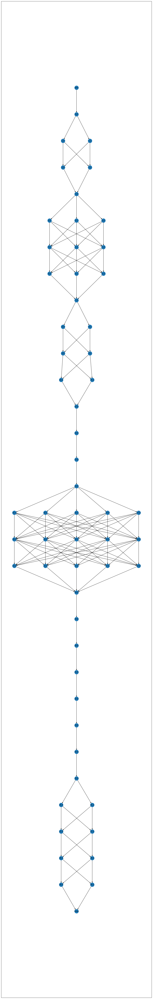

In [45]:
# Extract trellis DAG graph
trellis = mpmatching_utils.create_trellis(candidates)

# Plot trellis graph
trellis_draw = visualization.draw_trellis(trellis, figsize=(15, 100), dpi=200)
trellis_draw


In [46]:
path_prob, predecessor = mpmatching.viterbi_search(G_interp, trellis, "start", "target")


Node 1392528984 not reachable from 471626096
Node 1799664042 not reachable from 471626096
Node 1510397069 not reachable from 471626096
Node 1392528984 not reachable from 1964802079
Node 1799664042 not reachable from 1964802079
Node 1510397069 not reachable from 1964802079
Node 1392528984 not reachable from 843344513
Node 1799664042 not reachable from 843344513
Node 1510397069 not reachable from 843344513
Node 1392528984 not reachable from 1964802079
Node 1799664042 not reachable from 1964802079
Node 1510397069 not reachable from 1964802079
Node 1392528984 not reachable from 843344513
Node 1799664042 not reachable from 843344513
Node 1510397069 not reachable from 843344513


In [47]:
# Plot map-matching results
maps.draw_path(G_interp, trellis, predecessor)
maps